# Drugi domaci zadatak iz predmeta digitalna obrada slike 
## Esmir Pljakic 0205/2017, OS

In [1]:
# Ucitavanje potrebnih biblioteka koje su potrebne za operacije koje cemo koristiti
from pylab import *
%matplotlib inline

import skimage
from skimage import *
from skimage import exposure
from skimage import util
from skimage.util.dtype import dtype_range

import numpy as np

from scipy import ndimage
import time

### Prvi zadatak
U prvom zadatku je potrebno popraviti kvalitet ulazne slike koja je nastala polutoniranjem.

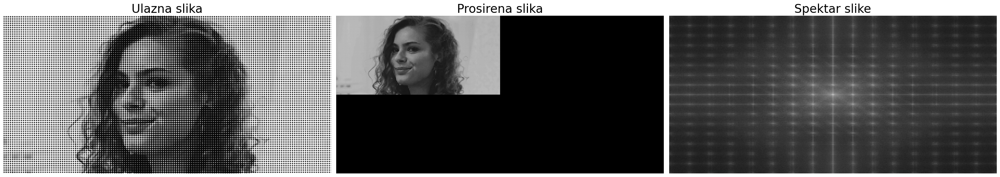

In [2]:
# Ucitavanje slike koju je potrebno obraditi
f = img_as_float(imread('../sekvence/girl_ht.tif'))

# Uzimamo dimenzije slike
[M, N] = shape(f)

# Nove dimenzije
P = 2*M - 1
Q = 2*N - 1

# Prosirena slika koja je duplo vecih dimenzija
# Prosirenje nulama
fp = zeros([P, Q])
# Upisivanje pocetne slike na odgovarajucem mestu
fp[0:M, 0:N] = f

# Furijeova transformacija 
# koristi se fftshitf da bi dobili centrirani spektar
Fp = fftshift(fft2(fp))

# Prikaz
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(28,16), dpi=100)
ax = axes.ravel()

ax[0].imshow(f, vmin = 0, vmax = 1, cmap = 'gray')
ax[0].set_title('Ulazna slika', fontsize=24)

ax[1].imshow(fp, vmin = 0, vmax = 1, cmap = 'gray')
ax[1].set_title('Prosirena slika', fontsize=24)

ax[2].imshow(log(1+abs(Fp)), cmap = 'gray')
ax[2].set_title('Spektar slike', fontsize=24)

for a in ax.ravel():
    a.axis('off')
tight_layout()
plt.show()

Na osnovu spektra slike vidimo na visokim ucestanostima detalje koje zapravo predstavljaju tackice na ulaznos slici. <br>
Da bismo dobili sto uniformniju sliku potrebno je ponistiti ove detalje koji se nalaze na visokim ucestanostima. <br>
Za ponistavanje tih detalja odlucio sam se koristiti <b>"Noc"</b> filtar, jer se ove tacke nalaze simetricno u odnosu na DC komponentu spektra.Noc filtar propusta sve sto se nalazi oko definisanog centra, ali posto je nama potrebno da ne propusti taj deo oko definisanog centra koristicemo 1-NOC, tj. reject filtar. Nisam uzimao bas sve koordinate ovih tacaka da ih filtriram vec par njih, a onda sam ove tacke koje se nalaze na visokim ucestanostima ubio sa obicnim gausovim LP filtrom cije se velicina, da kazem, propusnog opsega moze promeniti. Time sam naravno izgubio neke detalje slike, ali smo na predavanja govorili da se najveci broj informacije slike nalazi upravo oko DC komponente spektra.<br>

In [3]:
def cnotch(filt_type, notch, M, N, C, r, n=1):
    """""
    Funkcija koja kreira noc filtar za razlicite pozicije u spektru
    ulazi : 
        filt_type = tip koji zelimo filtar da koristimo
        notch  = da li zelimo da propustimo ili da ubijemo taj deo spektra
        M, N = dimenzije na osnovu kojih ce biti kreiran filtar 
        C = tacke oko kojih ce se kreirati filtar 
            automatski se kreira i filtar na komplementarnoj poziciji
        r = radijus filtra
        n = u slucaju Batervortovog filtra 
    uloga : 
        da iscrta obradjenu sliku koja je prosledjena funkciji
    """""
    # Dobijamo informaciju o tome koliko cemo filtara stvoriti i oko kojih pozicija
    N_filters = len(C) 
    
    # Kreiramo filtar zadatih dimenzija
    filter_mask = zeros([M, N])
    
    # Centriranje koordinata u zavisnosti od toga da li su parametri M i N parni ili ne
    if (M%2 == 0):
        y = np.arange(0,M) - M/2 + 0.5
    else:
        y = np.arange(0,M) - (M-1)/2
    if (N%2 == 0):
        x = np.arange(0,N) - N/2 + 0.5
    else:
        x = np.arange(0,N) - (N-1)/2
    
    X, Y = meshgrid(x,y)
    
    # Postocemo imati vise filtara za svaki od njih cemo proci po jednom kroz petlju
    for i in range(0,N_filters):
        # Trenutni obradjivani centar filtra
        C_current = C[i]
        # Definisemo i komplement u odnosu na trenutno obradjivani centar
        C_complement = zeros(2)
        C_complement[0] = -C_current[0]
        C_complement[1] = -C_current[1]
        
        # Definisemo koordinate za prvi filtar
        if (M%2 == 0):
            y0 = y - C_current[0] + M/2 - 0.5
        else:
            y0 = y - C_current[0] + (M-1)/2  
        if (N%2 == 0):
            x0 = x - C_current[1] + N/2 - 0.5
        else:
            x0 = x - C_current[1] + (N-1)/2 
            
        X0, Y0 = meshgrid(x0,y0)
        D0 = np.sqrt(np.square(X0) + np.square(Y0))
        
        
        # Definisemo koordinate za drugi filtar
        if (M%2 == 0):
            y0c = y - C_complement[0] - M/2 + 0.5
        else:
            y0c = y - C_complement[0] - (M-1)/2  
        if (N%2 == 0):
            x0c = x - C_complement[1] - N/2 + 0.5
        else:
            x0c = x - C_complement[1] - (N-1)/2 
            
        X0c, Y0c = meshgrid(x0c,y0c)
        D0c = np.sqrt(np.square(X0c) + np.square(Y0c))
    
        # U zavisnosti od toga koji je tip filtra pravimo jedan od sledecih
        if filt_type == 'gaussian':
            filter_mask = filter_mask + exp(-np.square(D0)/(2*np.square(r))) + exp(-np.square(D0c)/(2*np.square(r)))
        elif filt_type == 'btw':
            filter_mask = filter_mask + 1/(1+(D0/r)**(2*n)) + 1/(1+(D0c/r)**(2*n))
        elif filt_type == 'ideal':
            filter_mask[(D0<=r)] = 1
            filter_mask[(D0c<=r)] = 1
        else:
            print('Greska! Nije podrzan tip filtra: ', filt_type)
            return
    # Vracamo onaj filtar u zavisnosti od toga da li nam treba propusnig 
    # opsega ucestanosti ili nepropusnig opsega 
    if notch == 'pass':
        return filter_mask
    elif notch == 'reject':
        return 1 - filter_mask
    else:
        return

Moja druga ideja je bila da napravim filtar koji ce izgledati kao mreza i da ce na mestu gde bude ukrstanja ubijati te ucestanosti koje izazivaju tacke na slici. Tu mrezu sam napravio kreiranjem horizontalnih i vertikalnih linija koje su udaljenje jedne od drugih kao sto su to tacke koje se uocavaju u spektru slike. <br>

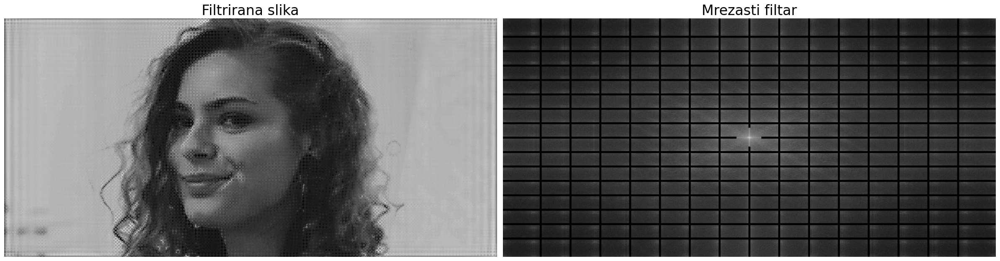

In [4]:
# Pomeraji po x i y osi, posto su delovi spektra koje treba ukloniti
# da kazem pojavljuju na uvek istim udaljenostima jedni od drugih
x_move = 300
y_move = 145

First_filt = zeros([P, Q])
# Kreiranje tih linija koje ce da uniste te delove spektra
for i in range(-7, 8, 1):
    First_filt[:, 2470 + i*x_move:2490 + i*x_move] = 1
    First_filt[1190 + i*y_move:1210 + i*y_move, :] = 1

# Cuvamo DC komponentu
First_filt[1100:1290, 2470:2490] = 0
First_filt[1190:1210, 2350:2600] = 0

# Filtriranje u frekvencijskom domenu
G_my_1 = Fp*(1-First_filt)
# Inverzna Furijeova transformacija
gp_my_1 = real(ifft2(ifftshift(G_my_1)))
# Odsecanje prosirenog dela slike
g_my_1 = gp_my_1[0:M, 0:N] 
g_my_1[g_my_1<0] = 0
g_my_1[g_my_1>1] = 1

# Iscrtavanje
fig, axes = plt.subplots(ncols = 2, figsize = (24,16), dpi = 100)
ax = axes.ravel()
ax[0].imshow(g_my_1, vmin = 0, vmax = 1, cmap = 'gray')
ax[0].set_title('Filtrirana slika', fontsize = 24)
ax[1].imshow(log(1+abs(G_my_1)), cmap = 'gray')
ax[1].set_title('Mrezasti filtar', fontsize = 24)
for a in ax:
    a.axis('off')
tight_layout()
plt.show()

Rezultati nisu losi, ali nisu ni dobri, pa sam nastavio dalje.<br>
Sada ovde definisem centre za koje ce biti kreiran Noc filtar, kao i za komplemente tih centara.

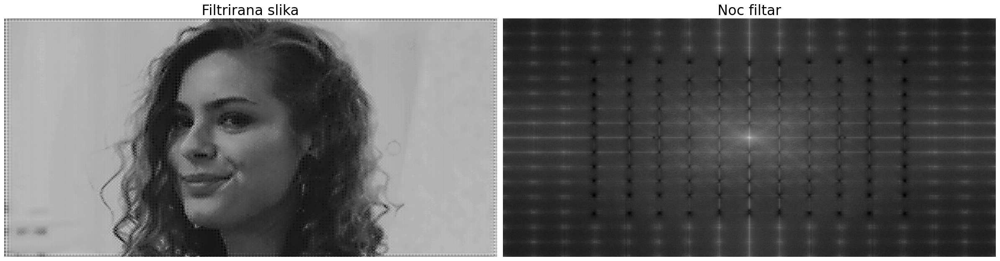

In [5]:
# Tackice u spektru su bile podjednako udaljene jedne od drugih
x_move = 302
y_move = 145

# Karakteristicne vrednosti koordinata
a = 1199
b = 2177
c = 1053
d = 2479
e = 2780

# Definisanje centara za Noc filtar
C = [[a, b], [c, b], [c, d], [c, e],
     
     [a, b-x_move], [c, b-x_move], [c-y_move, b-x_move], [c-y_move, b],
     [c-y_move, d], [c-y_move, e], [c-y_move, e+x_move], [c, e+x_move],
     
     [a, b-2*x_move], [c, b-2*x_move], [c-y_move, b-2*x_move], [c-2*y_move, b-2*x_move],
     [c-2*y_move, b-x_move], [c-2*y_move, b], [c-2*y_move, d], [c-2*y_move, e],
     [c-2*y_move, e+x_move], [c-2*y_move, e+2*x_move], [c-y_move, e+2*x_move], [c, e+2*x_move],
    
     [a, b-3*x_move], [c, b-3*x_move], [c-y_move, b-3*x_move], [c-2*y_move, b-3*x_move],
     [c-3*y_move, b-3*x_move], [c-3*y_move, b-2*x_move], [c-3*y_move, b-x_move],[c-3*y_move, b],
     [c-3*y_move, d], [c-3*y_move, e], [c-3*y_move, e+x_move], [c-3*y_move, e+2*x_move],
     [c-3*y_move, e+3*x_move], [c-2*y_move, e+3*x_move], [c-y_move, e+3*x_move], [c, e+3*x_move],
   
     [a, b-3*x_move-356], [c, b-3*x_move-356], [c-y_move, b-3*x_move-356], [c-2*y_move, b-3*x_move-356], 
     [c-3*y_move, b-3*x_move-356], [c-3*y_move-179, b-3*x_move-356], [c-3*y_move-179, b-3*x_move], [c-3*y_move-179, b-2*x_move],
     [c-3*y_move-179, b-x_move], [c-3*y_move-179, b], [c-3*y_move-179, d], [c-3*y_move-179, e],
     [c-3*y_move-179, e+x_move], [c-3*y_move-179, e+2*x_move], [c-3*y_move-179, e+3*x_move], [c-3*y_move-179, e+3*x_move+356],
     [c-3*y_move, e+3*x_move+356], [c-2*y_move, e+3*x_move+356], [c-y_move, e+3*x_move+356], [c, e+3*x_move+356]]

# Ovo su neke male tackice za koje sam mislio da su bitne
C2 = [[1199, 1518], [468, 2479], [468, 2176], [468, 2781]]

# Pozivanje funkcije
H = cnotch('gaussian', 'reject', P, Q, C, 42)
H2 = cnotch('gaussian', 'reject', P, Q, C2, 15)
# Filtriranje u frekvencijskom domenu
G = Fp*H*H2
# Inverzna Furijeova transformacija
gp = real(ifft2(ifftshift(G)))
g = gp[0:M, 0:N] 
g[g<0] = 0
g[g>1] = 1

# Iscrtavanje
fig, axes = plt.subplots(ncols = 2, figsize = (24,16), dpi = 100)
ax = axes.ravel()
ax[0].imshow(g, vmin = 0, vmax = 1, cmap = 'gray')
ax[0].set_title('Filtrirana slika', fontsize = 24)
ax[1].imshow(log(1+abs(G)), cmap = 'gray')
# Noc filtar bez svih tacaka
ax[1].set_title('Noc filtar', fontsize = 24)
for a in ax:
    a.axis('off')
tight_layout()
plt.show()

Sada sam na prethodnom filtru dodao jos mrezastu strukturu misleci da ce linije ubiti dobro tacke na visim ucestanostima a da ostavim Noc za tacke koje se nalaze na nizim ucestanostima, ali rezultati nisu bili bas sjajni.<br>

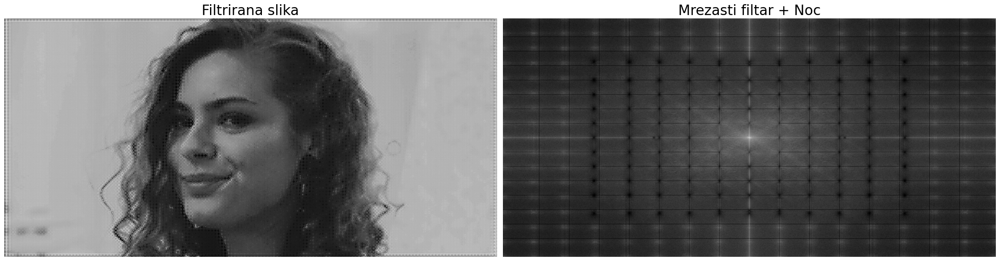

In [6]:
# Drugi filtar koji je kombinacija Noc filtra i mrezastog filtra
x_move = 302
y_move = 145

Second_filt = zeros([P, Q])
# Kreiranje mreze tj. filtra
# Imamo 15 vertikalnih i 15 horizontalnih linija
for i in range(-7, 8, 1):
    Second_filt[:, 2478 + i*x_move:2481 + i*x_move] = 1
    Second_filt[1198 + i*y_move:1201 + i*y_move, :] = 1  
# U odgovarajucem delu ubijamo taj filtar, jer tu ne treba da se nalazi
Second_filt[1054:1345, 2177:2781] = 0
Second_filt[:, 2478 :2481] = 0
Second_filt[1198:1201, :] = 0

# Filtriranje u frekvencijskom domenu
G_my_2 = Fp*(1-Second_filt)*H*H2
# Inverzna Furijeova transformacija
gp_my_2 = real(ifft2(ifftshift(G_my_2)))
g_my_2 = gp_my_2[0:M, 0:N] 
g_my_2[g_my_2<0] = 0
g_my_2[g_my_2>1] = 1

# Iscrtavanje
fig, axes = plt.subplots(ncols = 2, figsize = (24,16), dpi = 100)
ax = axes.ravel()
ax[0].imshow(g_my_2, vmin = 0, vmax = 1, cmap = 'gray')
ax[0].set_title('Filtrirana slika', fontsize = 24)
ax[1].imshow(log(1+abs(G_my_2)), cmap = 'gray')
ax[1].set_title('Mrezasti filtar + Noc', fontsize = 24)
for a in ax:
    a.axis('off')
tight_layout()
plt.show()

Za konacno resenje sam se odlucio da koristim Gausov LP filtar koji ce ove visoke ucestanosti totalno da ubije, a ucestanosti oko DC komponente da propusti.<br> Zasto bas LP filtar, pa zato da ne bih sada pravio za svaku tackicu u spektru noc filtar i trazio njene koordinate. Jednostavnije je pobiti te visoke ucestanosti jer ionako se tu nalazi malo informacija o slici.

In [7]:
def lpfilter(filt_type, M, N, sigma, n = 1):
    """""
    Funkcija koja kreira LP filtar za razlicite tipove filtara
    ulazi : 
        filt_type = tip koji zelimo filtar da koristimo
        M, N = dimenzije na osnovu kojih ce biti kreiran filtar 
        sigma = velicina propusnog opsega
        n = u slucaju Batervortovog filtra 
    uloga : 
        da vrati LP filtar
    """""
    # Centriranje koordinata u zavisnosti od toga da li su parametri M i N parni ili ne
    if (M%2 == 0):
        y = np.arange(0,M) - M/2 + 0.5
    else:
        y = np.arange(0,M) -(M-1)/2
    
    if (N%2 == 0):
        x = np.arange(0,N) - N/2 + 0.5
    else:
        x = np.arange(0,N) - (N-1)/2
    
    X, Y = meshgrid(x, y)
    D = np.sqrt(np.square(1*X) + np.square(2*Y))
    
    # U zavisnosti koji tip filtra je odabran pravimo razliciti filtar
    if filt_type == 'gaussian':
        filter_mask = exp(-np.square(D)/(2*np.square(sigma)))
    elif filt_type == 'btw':
        filter_mask = 1/(1+(D/sigma)**(2*n))
    elif filt_type == 'ideal':
        filter_mask = ones([M, N])
        filter_mask[D > sigma] = 0
    else:
        print('Greska! Nije podrzan tip filtrea: ', filt_type)
        return
    
    return filter_mask

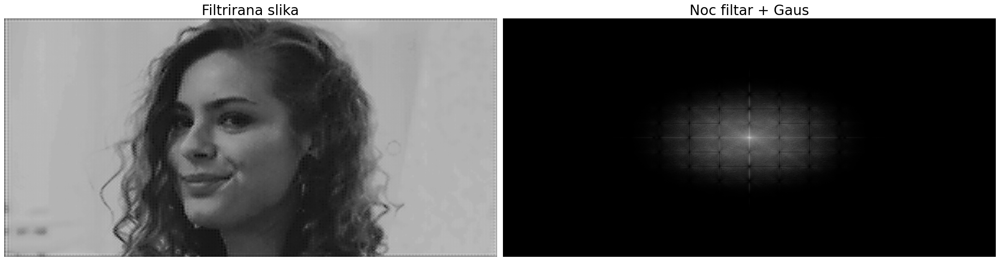

In [8]:
# Gausov LP filtar sa opsegom 260
G_gauss = lpfilter('gaussian', P, Q, 340)

# Spektar koji je kombinacija Gausa, Noca i mrezastog filtra
Gp_gauss = Fp*G_gauss*H*(1-Second_filt)*H2
# Inverzna Furijeova transformacija
gp_gauss = real(ifft2(ifftshift(Gp_gauss)))
g_gauss = gp_gauss[0:M, 0:N]
g_gauss[g_gauss<0] = 0
g_gauss[g_gauss>1] = 1

# Iscrtavanje
fig, axes = plt.subplots(ncols = 2, figsize = (24,16), dpi = 100)
ax = axes.ravel()
ax[0].imshow(g_gauss, vmin = 0, vmax = 1, cmap = 'gray')
ax[0].set_title('Filtrirana slika', fontsize = 24)
ax[1].imshow(log(1+abs(Gp_gauss)), cmap = 'gray')
ax[1].set_title('Noc filtar + Gaus', fontsize = 24)
for a in ax:
    a.axis('off')
tight_layout()
plt.show()

#### ZAKLJUCAK
Iz spektra finalne slike vidimo da su tackice u spektru koje izazivaju tackice na slici ubijene, ali su i dalje ostali neki tragovi na slici, sto je posledica neprecizno odredjenih koordinata ovih tacaka u spektru. <br>
Najbolje resenje noc filtar i Gausov LP filtar u kombinaciji, jeste da je noc filtar spor, ali najbolje ubija ove tacke u spektru. <br>

### Drugi zadatak
U drugom zadatku je potrebno proceniti varijasnu suma na slici i zatim uraditi adaptivno filtriranje te slike kako bi potisnuli taj sum. <br>
Potrebno je napraviti masku sa promenljivim dimenzijama (2r+1)x(2r+1), gde se r menja od 1 do 20, i da za svaku masku sracunamo lokalne varijanse za svaki piksel na slici. <br> 
Tim izracunavanjem lokalnih varijansi dobijamo matricu koja je istih dimenzija kao ulazna slika i na cijim se elementima nalaze lokalne varijanse piksela na toj poziciji. <br>
Za svaku od tih 20ak matrica koje cemo dobiti ciji su elementi lokalne varijanse tih piksela iscrtavamo histogram. Sa tih histograma treba da uocimo na kojoj vrednosti imamo najvise piksela sa istom lokalnom varijansom. Taj broj ce predstavljati varijansu suma i nakon toga je potrebno poznavajuci varijansu suma uraditi adaptivno filtriranje. 

In [9]:
# Ucitavanje slike
f = img_as_float(imread('../sekvence/lena_noise.tif'))

# Pravim niz od 20 elemenata gde ce se nalaziti odgovarajuce matrice lokalnih varijansi
hist = [0]*20;
# Za razlicite dimenzije maske proracunavamo lokalne varijanse
for r in range(1, 21):
    mask = ones([2*r+1,2*r+1])/(2*r+1)**2 # filtar za usrednjavanje
    # Srednja vrednost
    avg = ndimage.correlate(f, mask)
    # Srednja kvadratna vrednost
    sqr_avg = ndimage.correlate(f**2, mask)
    var = sqr_avg - avg**2 
    hist[r-1] = var
    

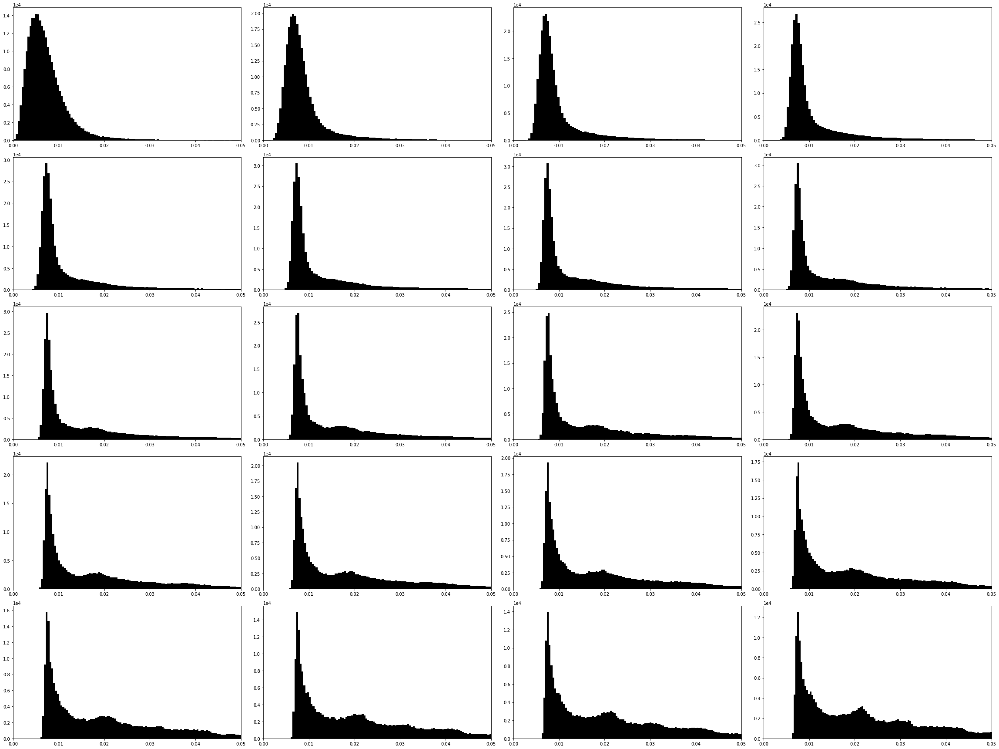

In [10]:
def plot_img_and_hist(image, axes, bins=256):
    """""
    Funkcija koja treba da iscrta histogram od ulazne slike
    ulazi : 
        image = slika, matrica za koju crtamo histogram
        axes = ose na kojoj cemo crtati histogram
        bins = broj celija histograma
    uloga : 
        crtanje histograma 
    """""
    ax_hist = axes
    # Iscrtavanje histograma
    ax_hist.hist(image.ravel(), bins = 256, color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    # Podesavanje dimenzije osa za prikazivanje histograma
    xmin, xmax = dtype_range[image.dtype.type]
    ax_hist.set_xlim(0, 0.05)
    y_min, y_max = ax_hist.get_ylim()
    ax_hist.set_ylim(y_min, y_max)
    return ax_hist

# Posto cemo imati 20 histograma napravio sam figuru dimenzija 5x4
fig = plt.figure(figsize=(32, 24))
axes = np.zeros((5, 4), dtype=np.object)
axes[0, 0] = plt.subplot(5, 4, 1)
axes[0, 1] = plt.subplot(5, 4, 2)
axes[0, 2] = plt.subplot(5, 4, 3)
axes[0, 3] = plt.subplot(5, 4, 4)
axes[1, 0] = plt.subplot(5, 4, 5)
axes[1, 1] = plt.subplot(5, 4, 6)
axes[1, 2] = plt.subplot(5, 4, 7)
axes[1, 3] = plt.subplot(5, 4, 8)
axes[2, 0] = plt.subplot(5, 4, 9)
axes[2, 1] = plt.subplot(5, 4, 10)
axes[2, 2] = plt.subplot(5, 4, 11)
axes[2, 3] = plt.subplot(5, 4, 12)
axes[3, 0] = plt.subplot(5, 4, 13)
axes[3, 1] = plt.subplot(5, 4, 14)
axes[3, 2] = plt.subplot(5, 4, 15)
axes[3, 3] = plt.subplot(5, 4, 16)
axes[4, 0] = plt.subplot(5, 4, 17)
axes[4, 1] = plt.subplot(5, 4, 18)
axes[4, 2] = plt.subplot(5, 4, 19)
axes[4, 3] = plt.subplot(5, 4, 20)

ax_hist1 = plot_img_and_hist(hist[0], axes[0, 0])
ax_hist2 = plot_img_and_hist(hist[1], axes[0, 1])
ax_hist3 = plot_img_and_hist(hist[2], axes[0, 2])
ax_hist4 = plot_img_and_hist(hist[3], axes[0, 3])
ax_hist5 = plot_img_and_hist(hist[4], axes[1, 0])
ax_hist6 = plot_img_and_hist(hist[5], axes[1, 1])
ax_hist7 = plot_img_and_hist(hist[6], axes[1, 2])
ax_hist8 = plot_img_and_hist(hist[7], axes[1, 3])
ax_hist9 = plot_img_and_hist(hist[8], axes[2, 0])
ax_hist10 = plot_img_and_hist(hist[9], axes[2, 1])
ax_hist11 = plot_img_and_hist(hist[10], axes[2, 2])
ax_hist12 = plot_img_and_hist(hist[11], axes[2, 3])
ax_hist13 = plot_img_and_hist(hist[12], axes[3, 0])
ax_hist14 = plot_img_and_hist(hist[13], axes[3, 1])
ax_hist15 = plot_img_and_hist(hist[14], axes[3, 2])
ax_hist16 = plot_img_and_hist(hist[15], axes[3, 3])
ax_hist17 = plot_img_and_hist(hist[16], axes[4, 0])
ax_hist18 = plot_img_and_hist(hist[17], axes[4, 1])
ax_hist19 = plot_img_and_hist(hist[18], axes[4, 2])
ax_hist20 = plot_img_and_hist(hist[19], axes[4, 3])

fig.tight_layout()

Uzeo sam filtar 3x3 da prikazem kako u tom slucaju izgleda spektar lokalne varijanse. 

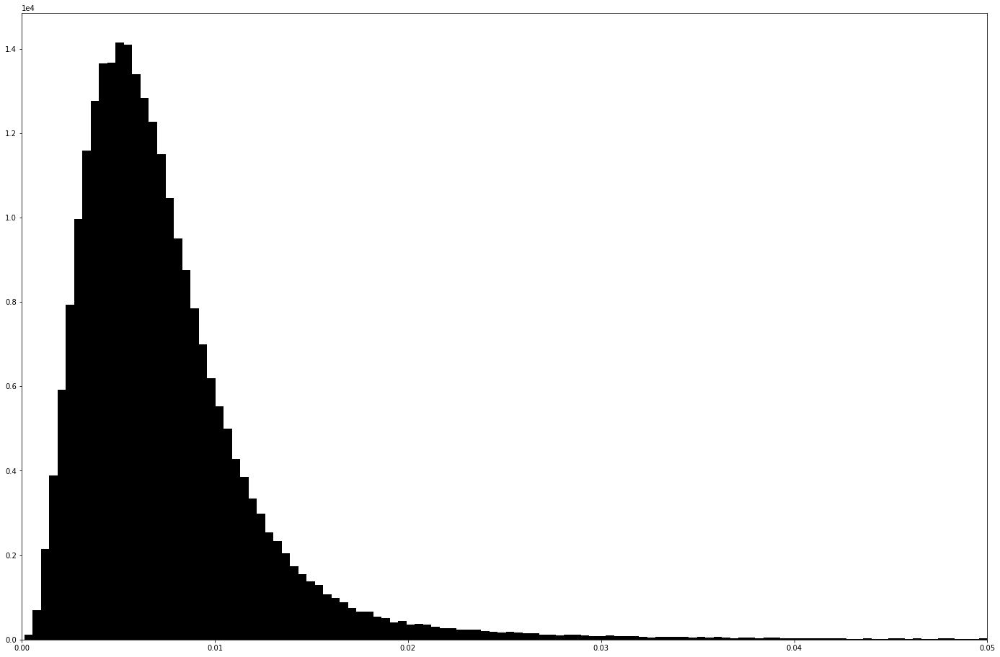

In [11]:
fig = plt.figure(figsize=(24, 16))
axes = np.zeros((1, 1), dtype=np.object)
axes[0, 0] = plt.subplot(1, 1, 1)
ax_hist1 = plot_img_and_hist(hist[0], axes[0, 0])

Sa ovog histograma a i sa ostalih vidimo da se lokalne varijanse grupisu oko vrednosti 0.0075, sto zapravo predstavlja i varijansu datog suma. <br>
Takodje vidimo da sa povecanjem dimenzije maske kupimo neke lokalne varijanse piksela cije vrednosti nisu bas sve lepo grupisane oko varijanse suma koja je 0.0075, vec postoje i druge tacke nagomilavanja, sto je posledica vece maske i veceg broja piksela koji bivaju zahvaceni tom maskom. Sa spektara za manje dimenzije maske vidimo da postoje takodje pikseli koji imaju lokalnu varijansu koja je razlicita od varijanse suma ali u znatno manjoj meri nego kod maske sa vecim dimenzijama. Prosto tu upada samo veci broj piksela koji imaju razlicite vrednosti lokalnog suma. <br>
Sada vrsimo adaptivno filtriranje. Poenta je u jednoj tezinskoj funkciji koja ce biti 1 gde je slika uniformna a bice bliska 0 tamo gde su ivice. <br>
Odlucio sam se za masku dimenzija 7x7, jer mi deluje da on ukloni dosta dobro sum.

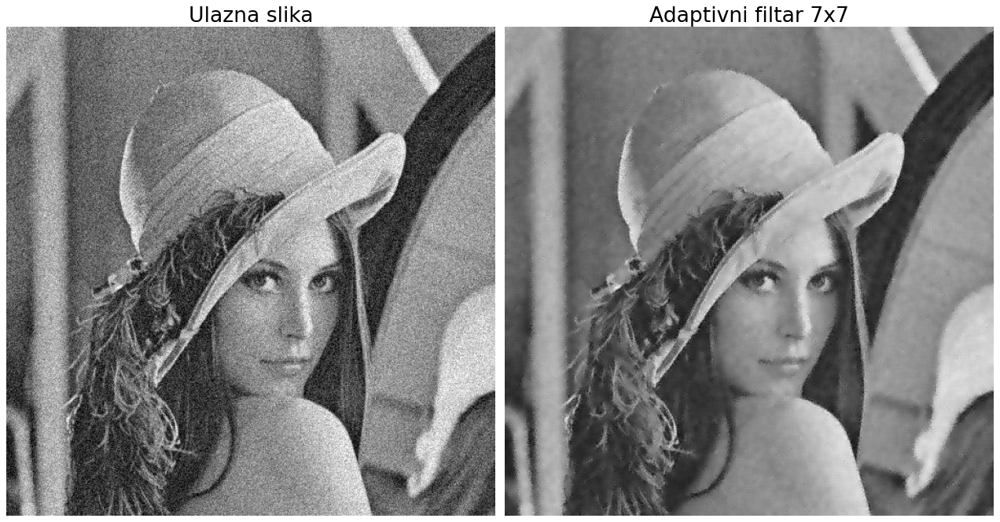

In [12]:
# Varijansa suma
nvar = 0.0075
# Maska koju cemo da primenimo za filtar
# r = 3
mask = ones([7,7])/49

# Sredjna vrednost slike
f_avg = ndimage.correlate(f, mask)
# Srednja kvadratna vrednost slike
fsqr_avg = ndimage.correlate(f**2, mask)

# Lokalna varijansa
fvar = fsqr_avg - f_avg**2

# Tezinska funkcija
w = nvar/fvar
w[w>1]=1

# Estimirana slika 
f_est = f + w*(f_avg-f) # tezinska funkcija treba da bude jednaka 1 tamo gde su unufirmne povrsine

# Iscrtavanje
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,16), dpi=80)
ax=axes.ravel()

ax[0].imshow(f, vmin = 0, vmax = 1, cmap='gray')
ax[0].set_title('Ulazna slika', fontsize = 24)

ax[1].imshow(f_est, vmin = 0, vmax = 1, cmap='gray')
ax[1].set_title('Adaptivni filtar 7x7', fontsize = 24)

for a in ax:
    a.axis('off')
tight_layout()
plt.show()

### Treci zadatak
U trecem zadatku je potrebno izvrsiti restauraciju slike. Na slici se nalaze automobili na putu i slika je jako mutna zbog lose podesenog fokusa ili zbog do sociva kamere. <br>
Rasipanje svetlosti se moze opisati pomocu Gausove funkcije. <br>

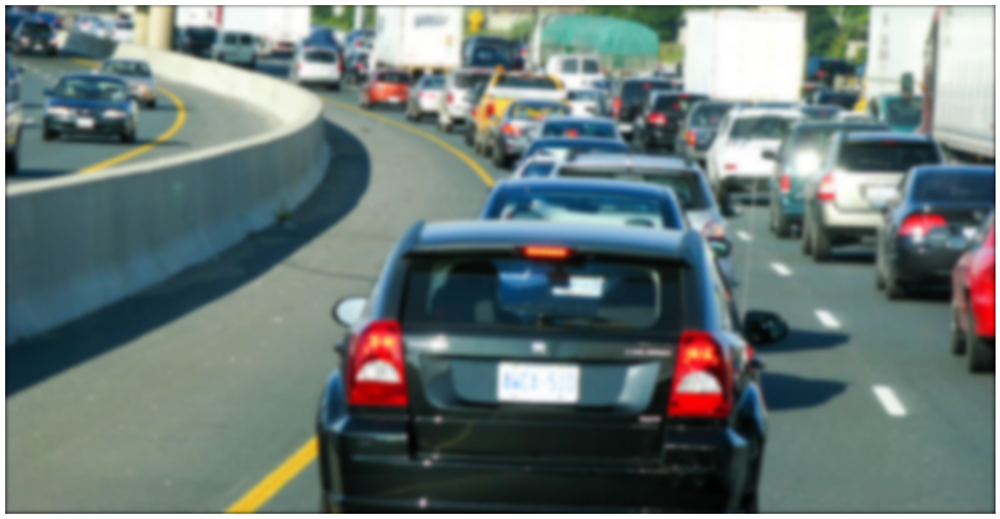

In [13]:
# Ucitavanje slike
f = img_as_float(imread('../sekvence/road_blur.png'))
# Prikaz
figure(figsize = (24,24))
imshow(f)
plt.axis('off')
plt.show()

# Uzimanje slojeva slike
f1 = f[:,:,0]
f2 = f[:,:,1]
f3 = f[:,:,2]
f4 = f[:,:,3] # ova komponenta nema nikakvu informaciju o slici

Hteo sam da pronadjem spektre svih slojeva slike i da ih prikazem. Razlog za to je da bih mogao da vidim kako ce izgledati spektri svih delova slike kako bih mogao da pomocu Gausove funkcije, kako je receno u zadatku, opisem degradaciju koja je unistila ovu sliku.<br>

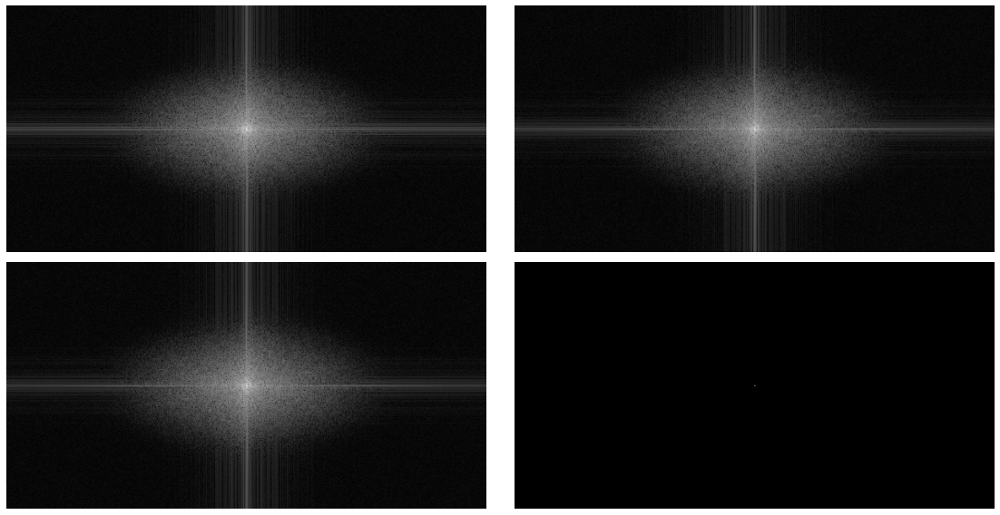

In [14]:
G1 = fftshift(fft2(f1))
G2 = fftshift(fft2(f2))
G3 = fftshift(fft2(f3))
G4 = fftshift(fft2(f4))

# Iscrtavanje
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (16, 8))
ax = axes.ravel()
ax[0].imshow(log(1+abs(G1)), cmap = 'gray')
ax[1].imshow(log(1+abs(G2)), cmap = 'gray')
ax[2].imshow(log(1+abs(G3)), cmap = 'gray')
ax[3].imshow(log(1+abs(G4)), cmap = 'gray')

for a in ax:
    a.axis('off')    
tight_layout()
plt.show()

Iz oblika ovih spektara rekao bih da je to neki elipsoidni Gaus, pa sam ovu funkciju ispod izmenio malo i napravio da bude elipsoidni Gaus. Ta funkcija koju dobijemo kao povratnu bice koriscenja kao degradaciona funkcija.

In [15]:
def lpfilter(filt_type, M, N, sigma, n = 1):
    """""
    Funkcija koja kreira LP filtar za razlicite tipove filtara
    ulazi : 
        filt_type = tip koji zelimo filtar da koristimo
        M, N = dimenzije na osnovu kojih ce biti kreiran filtar 
        sigma = velicina propusnog opsega
        n = u slucaju Batervortovog filtra 
    uloga : 
        da vrati LP filtar
    """""
    # Centriranje koordinata u zavisnosti od toga da li su parametri M i N parni ili ne
    if (M%2 == 0):
        y = np.arange(0,M) - M/2 + 0.5
    else:
        y = np.arange(0,M) -(M-1)/2
    
    if (N%2 == 0):
        x = np.arange(0,N) - N/2 + 0.5
    else:
        x = np.arange(0,N) - (N-1)/2
    
    X, Y = meshgrid(x, y)
    D = np.sqrt(np.square(X) + np.square(2*Y))
    
    # U zavisnosti koji tip filtra je odabran pravimo razliciti filtar
    if filt_type == 'gaussian':
        filter_mask = exp(-np.square(D)/(2*np.square(sigma)))
    elif filt_type == 'btw':
        filter_mask = 1/(1+(D/sigma)**(2*n))
    elif filt_type == 'ideal':
        filter_mask = ones([M, N])
        filter_mask[D > sigma] = 0
    else:
        print('Greska! Nije podrzan tip filtrea: ', filt_type)
        return
    
    return filter_mask

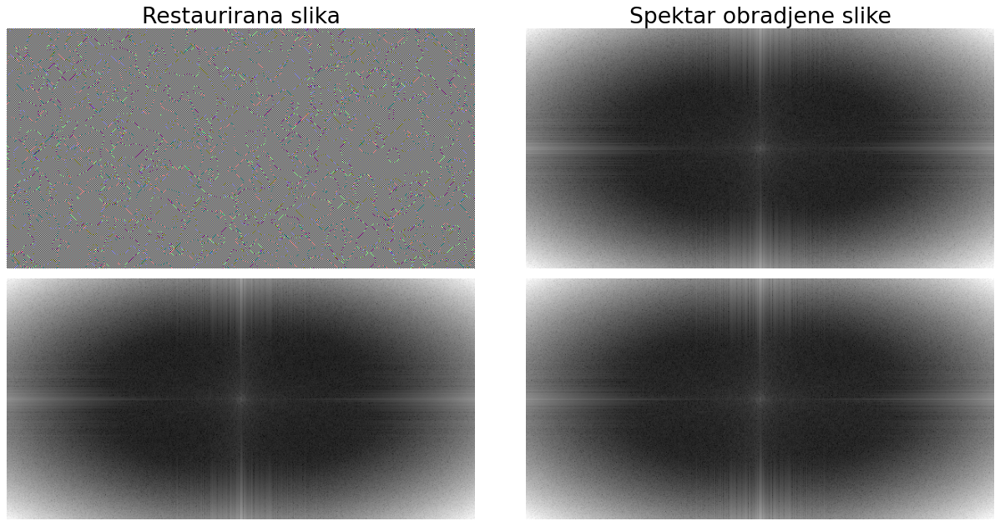

In [16]:
# Pravimo novu sliku koja je istih dimenzija kao ulazna slika
g = np.zeros(shape(f))
# Prepisujemo onaj sloj koji nema informacija
g[:,:,3] = f[:,:,3]
# Uzimamo dimenziju slike
dim = shape(f)

# Pozivamo funkciju da nam napravi Gausov LP filter sa devijacijom 60
H = lpfilter('gaussian', dim[0], dim[1], 60)

# Za svaki sloj slike radimo inverzno filtriranje
F_filt1 = G1/H
F_filt2 = G2/H
F_filt3 = G3/H

# Za svaki sloj radimo inverznu Furijeovu transformaciju
g[:,:,0] = real(ifft2(ifftshift(F_filt1)))
g[:,:,0][g[:,:,0]>1] = 1
g[:,:,0][g[:,:,0]<0] = 0

g[:,:,1] = real(ifft2(ifftshift(F_filt2)))
g[:,:,1][g[:,:,1]>1] = 1
g[:,:,1][g[:,:,1]<0] = 0

g[:,:,2] = real(ifft2(ifftshift(F_filt3)))
g[:,:,2][g[:,:,2]>1] = 1
g[:,:,2][g[:,:,2]<0] = 0

# Iscrtavanje
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (16,8), dpi = 80)
ax = axes.ravel()

ax[0].imshow(g)
ax[0].set_title('Restaurirana slika', fontsize = 24)
ax[1].imshow(log(1+abs(F_filt1)), cmap = 'gray')
ax[1].set_title('Spektar obradjene slike', fontsize = 24)
ax[2].imshow(log(1+abs(F_filt2)), cmap = 'gray')
ax[3].imshow(log(1+abs(F_filt3)), cmap = 'gray')

for a in ax:
    a.axis('off')
tight_layout()
plt.show()

Vidimo da su visoke ucestanosti mnogo izrazene i potrebno je ove komponente na visokim ucestanostima unistiti. Nije dovoljno samo inverzno filtriranje. Visoke ucestanosti cemo unistiti pomocu Vinerovog filtra. Vinerov filtar minimizuje srednju kvadratnu gresku koja nastaje usled invernznog filtriranja u prisustvu suma. <br>
Disperziju i koeficijent Vinerovog filtra sam trazio preko interact-a i gledao za koje brojeve se dobija slika.

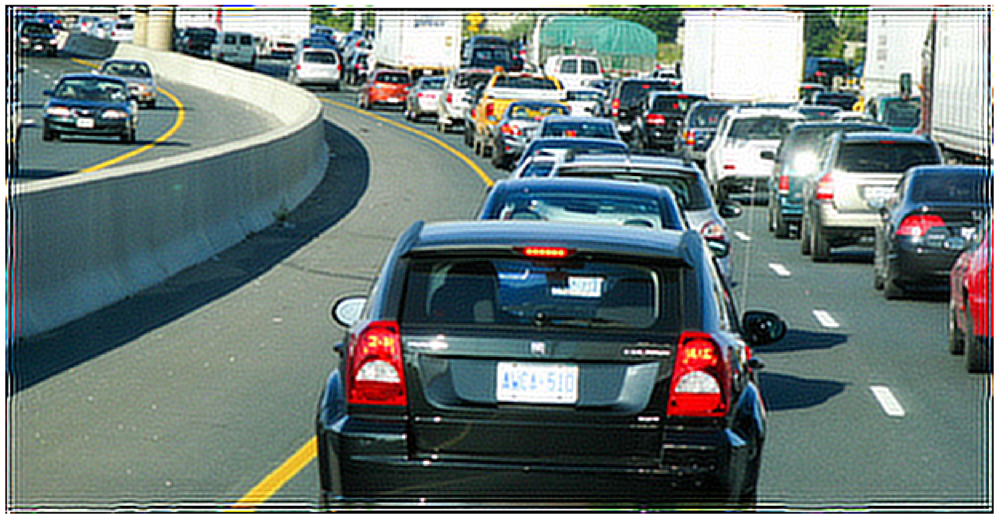

In [17]:
# Pravimo novu sliku koja je istih dimenzija kao ulazna slika
g = np.zeros(shape(f))
# Prepisujemo poslednji sloj
g[:,:,3] = f[:,:,3]
# Uzimamo dimenziju slike
dim = shape(f)

# Pozivamo funkciju da nam napravi Gausov LP filter sa devijacijom 60
H = lpfilter('gaussian', dim[0], dim[1], 60)
# Vinerov filtar za koeficijentom k
k = 0.000099999
W = (abs(H)**2)/(abs(H)**2 + k)
# Ovo je bio test kako bi bilo koristiti Gausa za potiskivanje visokih ucestanosti
W1 = lpfilter('gaussian', dim[0], dim[1], 70)

# Konacni spektri (estimirani)
F_filt1 = (G1/H)*W
F_filt2 = (G2/H)*W
F_filt3 = (G3/H)*W

# Za svaki sloj radimo inverznu Furijeovu transformaciju
g[:,:,0] = real(ifft2(ifftshift(F_filt1)))
g[:,:,0][g[:,:,0]>1] = 1
g[:,:,0][g[:,:,0]<0] = 0

g[:,:,1] = real(ifft2(ifftshift(F_filt2)))
g[:,:,1][g[:,:,1]>1] = 1
g[:,:,1][g[:,:,1]<0] = 0

g[:,:,2] = real(ifft2(ifftshift(F_filt3)))
g[:,:,2][g[:,:,2]>1] = 1
g[:,:,2][g[:,:,2]<0] = 0

# Iscrtavanje
figure(figsize = (24,24), dpi = 120)
imshow(g)
plt.axis('off')
plt.show()

#### Rezultat : AWCA - 510

### Cetvrti zadatak
U cetvrtom zadatku je bilo potrebno realizovati dve funkcije filter_gauss i filter_gauss_freq. Obe funkcije imaju istu funkcionalnost samo je jedna u prostornom domenu a druga u frekvencijskom domenu. Prvu funkciju sam uradio po uzoru na prvi domaci samo sam izbacio deo koji se odnosio na bilateralni filtar i tako dobio Gausov filtar. <br>
#### Prostorni domen 
Za prostorni domen sliku sam prosirio sa svih strana za koeficijent r pomocu funkcije expand_image, a onda sam uradio i filtriranje u prostornom domenu. Svi komentari se nalaze unutar tih funkcija. <br>
#### Frekvencijski domen
Prosirilo sam sliku za desne i donje strane za radius(da bi izbegli greske usled cirkularnosti konvolucije), onda sam uradio Furijeovu transformaciju na tako prosirenu sliku. Drugi korak je bio pravljenje maske na isti nacin kao za prostorni domen a potom smo tu masku prosirili tako da dimenzije prosirene maske odgovaraju dimenzijama prosirene slike. Potom je uradjena Furijeova transformacija maske, izvrseno mnozenje ova dva sada vec spektra, onda inverzna Furijeova transformacija i na kraju odsecanje i dobijanje originalne slike. <br>

In [18]:
# Ucitavanje slike
f = img_as_float(imread('lena.tif'))

In [19]:
def expand_image(x, r):
    """""
    Fukncija koja vrsi prosirivanje slike ponavljanjem redova slike odgovarajuci broj puta.
    ulazi : 
        x = slika koja treba da se prosiri
        r = koliko puta treba ponoviti redove i kolone slike
    izlaz :
        Prosirena slika sa svih strana za dato r.
    """""
    # Dimenzije koje ce se koristiti za kreiranje prosirene slike
    s = (len(x) + 2*r, len(x[0]) + 2*r)    
    # Kreiramo sliku koja je prosirenih dimenzija u odnosu na ulaznu sliku
    image = np.zeros(s) 
    # U centralnom delu nove slike upisujemo vrednosti piksela ulazne slike
    image[r : len(x) + r, r : len(x[0]) + r] = x[:, :]                 
    
    # Definisao sam duzinu slike po x i y osi, n1 i n2 respektivno
    n1 = len(x)
    n2 = len(x[0])
    
    # Petlja koja ima ulogu da ponavlja redove i kolone odgovarajuci broj puta
    k = r
    while k > 0:
        # Prosirujemo sliku za gornji red slike
        image[k - 1, k : k + n2] = image[k, k : k + n2]
        # Prosirujemo sliku za donji red slike
        image[k + n1, k : k + n2] = image[k + n1 - 1, k : k + n2]   
        # Prosirujemo sliku za levu kolonu
        image[k :  k + n1, k - 1] = image[k : k + n1, k]
        # Prosirujemo sliku za desnu kolonu
        image[k : k + n1, k + n2] = image[k : k + n1, k+ n2 - 1]
    
        # Prosirivanje coskova slike odg pikselima koji se nalaze u coskovima prethodne slike
        image[k - 1][k - 1] = image[k][k]
        image[k - 1][k + n2] = image[k][k + n2 - 1]
        image[k + n1][k - 1] = image[k + n1 - 1][k]
        image[k + n1][k + n2] = image[k + n1 - 1][k + n2 - 1]
        
        # Posto sliku u svakoj petlji uvecavamo za 2 reda i 2 kolone, nove dimenzije slike se uvecavaju takodje za 2 
        n1 = n1 + 2
        n2 = n2 + 2  
        k -= 1
        
    return image

In [20]:
def filter_gauss1(image, radius, sigma):
    """""
    Funkcija koja ima funkciju prostornog Gausovog filtra.
    Ova funkcija ce se koristiti samo za poredjenje sa novom funkcijom koja je optimizovana.
    To sam ostavio kao rezultat da i nova funkcija daje iste razultate.
    """""
    r = radius        
    # Tezinska funkcija, koja zavisi od prostorne udaljenosti piksela u masci od centra maske
    # Gausov filtar
    x = list(range(-r, r + 1))
    y = list(range(-r, r + 1))
    X, Y = meshgrid(x, y)
    E = exp(-(np.square(X) + np.square(Y))/(2*np.square(sigma)))
    # Normalizacija maske
    E = E/sum(E.flatten())
        
    # Slika koja ce biti izlaz funkcije, koja je jednakih dimenzija kao i ulazna slika
    new_image = np.zeros(image.shape)
        
    # Pravimo prosirenu sliku od ulazne slike
    ex_image = expand_image(image, r)
        
    # Prolazak kroz svaki piksel ulazne slike
    xmin  = r
    xmax =  r + len(image)
    ymax =  r + len(image[0])
    while xmin < xmax:
        ymin = r
        while ymin < ymax:
            # Konacna vrednost piksela kojeg cemo upisati u novoj slici nakon filtriranja
            piksel = 0
            # Dimenzije koje ce se koristiti za prosirenu sliku
            up  = xmin - r
            down = xmin + r + 1
            left = ymin - r
            right = ymin + r + 1
            # Mnozenje elemenata matrice filtra sa odgovarajucom okolinom centralnog piksela
            piksel = E * ex_image[up:down, left:right]
            piksel = sum(piksel.flatten())
            # Upisivanje konacne vrednosti piksela nakon normalizacije 
            new_image[xmin - r][ymin - r] = piksel
            ymin += 1
        xmin += 1
                
    return new_image  

In [21]:
def expand_image_freq(x, r):
    """""
    Fukncija koja vrsi prosirivanje slike sa desne i donje strane zbog frekvencijskog filtriranja.
    ulazi : 
        x = slika koja treba da se prosiri
        r = koliko puta treba ponoviti redove i kolone slike
    izlaz :
        Prosirena slika sa svih strana za dato r.
    """""
    # Dimenzije koje ce se koristiti za kreiranje prosirene slike
    s = (len(x) + r, len(x[0]) + r)    
    # Kreiramo sliku koja je prosirenih dimenzija u odnosu na ulaznu sliku
    image = np.zeros(s) 
    # U gornjem levom uglu upisujemo originalnu sliku
    image[0 : len(x) ,0 : len(x[0])] = x[:, :]     
    
    # Definisao sam duzinu slike po x i y osi, n1 i n2 respektivno
    n1 = len(x)
    n2 = len(x[0])
    
    # Petlja koja ima ulogu da ponavlja redove i kolone odgovarajuci broj puta
    k = r
    while k > 0:
        # Prosirujemo sliku za donji red slike
        image[n1, 0 : n2] = image[n1 - 1, 0 : n2]   
        # Prosirujemo sliku za desnu kolonu
        image[0 : n1, n2] = image[0 : n1, n2 - 1]
    
        # Prosirivanje donjeg desnog coska slike odg. pikselom koji se nalazi u donjem desnom cosku
        image[n1][n2] = image[n1 - 1][n2 - 1]
        
        # Posto sliku u svakoj petlji uvecavamo za 2 reda i 2 kolone, nove dimenzije slike se uvecavaju takodje za 2 
        n1 = n1 + 1
        n2 = n2 + 1  
        k -= 1
        
    return image

Gausova maska za prostorno filtriranje ima elemente koji su simetricni u odnosu na centralni, a centralni element je 1. Takodje za izracunavanje konacne usrednjene slike preko Gausovog prostornog filtra nije potrebno poznavati vrednosti lokalnih piksela. Ideja za razdvajanje 2D Maske na 1D lezi u tome sto je kod Gausa moguce raditi usrednjavanje po X pa po Y osi i rezultati ce ostati isti. Ovime smo znatno ubrzali funkciju i njena slozenost nije kao u onoj prethodnoj N^2 vec je 2N jer imamo 2 for petlje koje vrse usrednjavanje po X pa po Y osi. O ovoj separabilnosti, da se moze raditi usrednjavanje po x i po y osi nezavisno, sam saznao na predavanju za detekciju ivica gde se pominje da je to moguce uraditi i onda sam to realizovao u kodu ispod. Prva slika u kojoj upisujem koeficijente usrednjavanja po x osi ima dimenzije po y osi kao i prosirena slika zato sto tu nisam vrsio usrednjavanje a po x osi ima dimenziju kao i ulazna slika. Druga slika ima dimenzije koa i originalna slika jer smo tu iskoristili dobijenu prvu sliku i onda izvrsili usrednjavanje po y osi. Kao finalan rezultat posto nigde nismo izvrsili normalizaciju te 1D maske, celu sliku delimo sa vrednoscu 2D maske, jer mi dobijamo rezultat kao da smo vrsili filtriranje sa 2D maskom a ne sa 2x 1D maskom i onda je potrebno to uraditi kako bi se dobile finalne vrednosti slike.

In [22]:
def filter_gauss(image, radius, sigma):
    """""
    Fukncija koja predstavlja Gausovo filtriranje u prostornom domenu.
    ulazi : 
        image = slika koja treba da se prosiri
        radius = vrednost kojom sirimo sliku, velicina maske
        sigma = devijacija Gausove funkcije
    izlaz :
        Prosirena slika sa svih strana za dato r.
    """""
    r = radius
    # Prosirivanje slike
    ex = expand_image(image, r)
 
    # Formiramo masku koja je oblika matrice
    x = list(range(-r, r + 1))
    y = list(range(-r, r + 1))
    X, Y = meshgrid(x, y)
    E = exp(-(np.square(X) + np.square(Y))/(2*np.square(sigma)))
    # Vrednost svih koeficijenata u masci
    E_sum = sum(E.flatten())
    
    # Formiramo masku koja je oblika 1D 
    gaus_x = exp(-np.square(x)/(2*np.square(sigma)))
    
    # Formiramo sliku u kojoj cemo cuvati u kolonama usrednjene vrednosti po X osi
    first = zeros([len(image)+2*r,len(image[0])])
    # Formiramo sliku u kojoj cemo iskoristiti usrednjene vrednosti po X osi, izvrsiti usrednjavanje po Y osi i dobiti konacnu sliku.
    # Rezultate ovog usrednjavanja pisem u re
    second = zeros([len(image),len(image[0])])
    
    # Vrsimo usrednjavanje po X osi
    for i in range(0, len(image[0])):
        pom =  np.matmul(gaus_x, np.transpose(ex[:, i:i+2*r+1]))
        first[:,i] = pom
        
    # Vrsimo usrednjavanje po Y osi
    for j in range(0, len(image)):
        pom = np.matmul(gaus_x, first[j:j+2*r+1,:])
        second[j,:] = pom
    
    # Dobijenu sliku delimo sa sumom matrice 2D kako bi normalizovali vrednosti dobijene slike
    second = second/E_sum
    return second

In [23]:
def filter_gauss_freq(image, radius, sigma):
    """""
    Fukncija koja predstavlja Gausovo filtriranje u frekvencijskom domenu.
    ulazi : 
        image = slika koja treba da se prosiri
        radius = vrednost kojom sirimo sliku, velicina maske
        sigma = devijacija Gausove funkcije
    izlaz :
        Prosirena slika sa svih strana za dato r.
    """""
    # Pravimo masku kao u funkciji za prostorno filtriranje
    r = radius
    k = list(range(-r, r + 1))
    l = list(range(-r, r + 1))
    X, Y = meshgrid(k, l)
    mask = exp(-(np.square(X) + np.square(Y))/(2*np.square(sigma)))
    
    # Vrsimo prosirivanje slike
    ex_image = expand_image_freq(image, r)
    # Uzimamo dimenzije prosirene slike za kreiranje maske
    s = (len(ex_image), len(ex_image[0]))
    # Furijeova transformacija prosirene slike
    F = fftshift(fft2(ex_image))
    # Pravljenje maske koja je istih dimenzija kao slika
    ex_mask = np.zeros(s)
    # Upisivanje napravljene maske u gornjem levom uglu
    ex_mask[0:2*r+1, 0:2*r+1] = mask/sum(mask.ravel())
    # Furijeova transformacija maske
    M = fftshift(fft2(ex_mask))
   
    # Filtriranje
    G = F * M
    
    # Inverzna Furijeova transformacija
    gp = real(ifft2(ifftshift(G)))
    g = gp[r:len(image)+r, r:len(image[0])+r]
    g[g<0] = 0
    g[g>1] = 1
    
    return g 

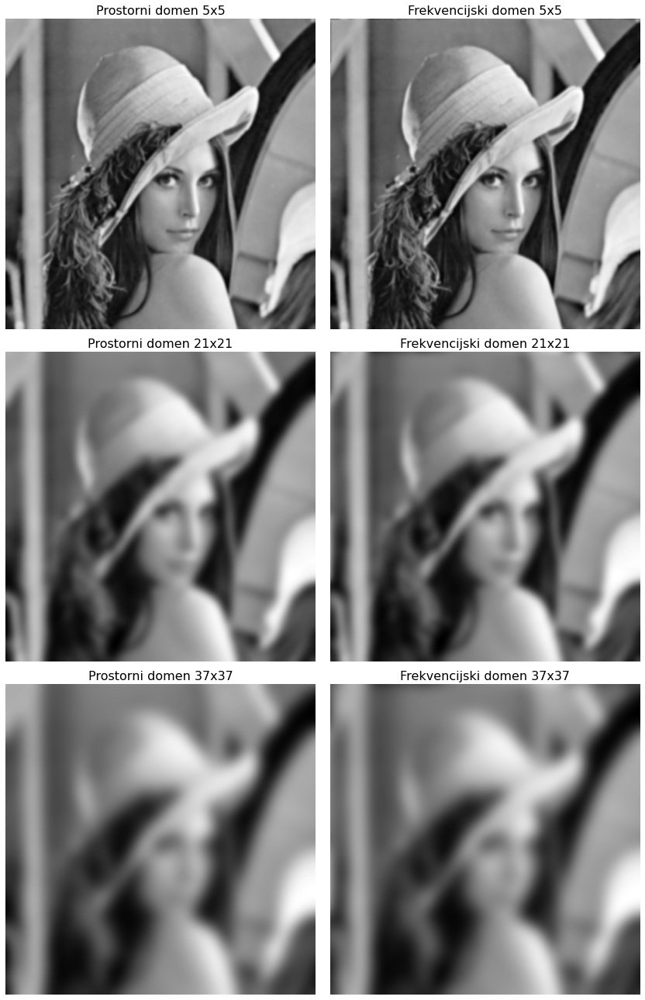

In [24]:
# Pozvacu funkcije tri puta za razlicite parametre da bi uporedili rezultate
image_1 = [0]*3
image_2 = [0]*3

for i in range(0, 3):
    image_1[i] = filter_gauss(f, i+5+15*i, (i+5+15*i)/3)
    image_2[i] = filter_gauss_freq(f, i+5+15*i, (i+5+15*i)/3)
    
# Iscrtavanje
fig, axes = plt.subplots(nrows = 3, ncols = 2, figsize = (12, 18))
ax = axes.ravel()

ax[0].imshow(image_1[0], cmap = 'gray')
ax[0].set_title('Prostorni domen 5x5', fontsize = 16)
ax[1].imshow(image_2[0], cmap = 'gray')
ax[1].set_title('Frekvencijski domen 5x5', fontsize = 16)

ax[2].imshow(image_1[1], cmap = 'gray')
ax[2].set_title('Prostorni domen 21x21', fontsize = 16)
ax[3].imshow(image_2[1], cmap = 'gray')
ax[3].set_title('Frekvencijski domen 21x21', fontsize = 16)

ax[4].imshow(image_1[2], cmap = 'gray')
ax[4].set_title('Prostorni domen 37x37', fontsize = 16)
ax[5].imshow(image_2[2], cmap = 'gray')
ax[5].set_title('Frekvencijski domen 37x37', fontsize = 16)

for a in ax:
    a.axis('off')
tight_layout()
plt.show()

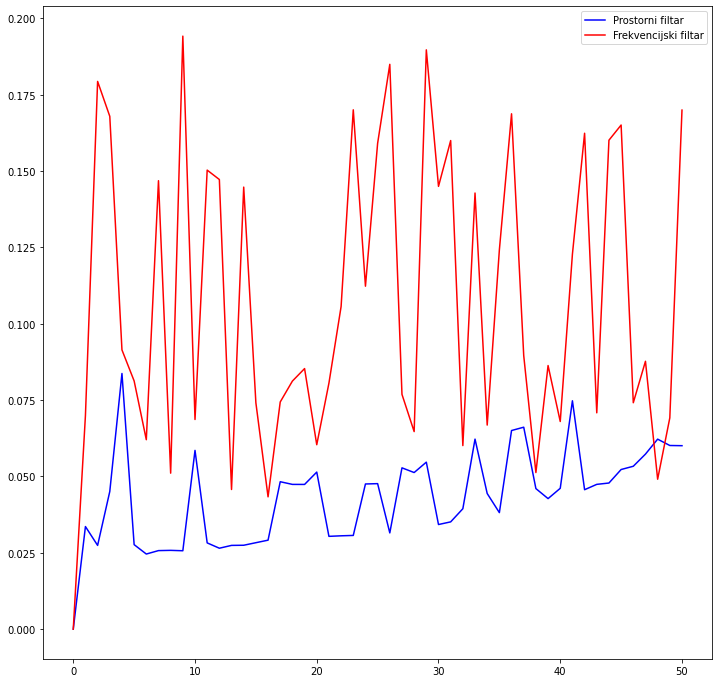

In [27]:
# Pravim dva niza u kojima ce biti smesteno vremena izvrsavanja funkcija
time_1 = [0]*51;
time_2 = [0]*51;
for r in range(1, 51):
    # Pozivanje prostornog filtra
    start = time.time() 
    h1 = filter_gauss(f, r, r/3)
    end = time.time() 
    execution_time = (end - start)
    time_1[r] = execution_time
    
    # Pozivanje frekvencijskog filtra
    start_1 = time.time()
    h2 = filter_gauss_freq(f, r, r/3)
    end_1 = time.time()
    execution_time_1 = (end_1 - start_1)
    time_2[r] = execution_time_1
    
# Osa po kojoj ce se crtati funkcije vremena izvrsavanja
t = np.arange(0.0, 51.0, 1.0)
# Iscrtavanje
plt.figure(figsize = (12,12))
plt.plot(t, time_1, 'b',  label='Prostorni filtar')
plt.plot(t, time_2, 'r', label='Frekvencijski filtar')
plt.legend()
plt.show()

#### Rezultat :
Receno je da se odredi velicina filtra preko koje bi trebali koristiti frekvencijski domen, ali sa ovako dobijenom funkcijom u prostornom domenu jako je tesko reci ima li tu neke granice.

Da funkcija gde radimo nezavisno usrednjavanja po x i y osi daje iste rezultate kao koriscenjem 2D maske prilazem sledeci primer:

In [26]:
# Napravio sam neku matricu sa nekim brojevima
image = zeros([2, 3])
# Usvojio sam da je r = 1
r = 1
image[1,:] = 2
image[0,:] = 3
image[:,1] = 1

Dva_n = filter_gauss(image, r, r/3)
N_na_kvadrat = filter_gauss1(image, r, r/3)

print(Dva_n)
print('\n')
print(N_na_kvadrat)
# Dobijamo iste koeficijente izlaznih matrica

[[2.96751548 1.04323396 2.96751548]
 [1.9998819  1.02197129 1.9998819 ]]


[[2.96751548 1.04323396 2.96751548]
 [1.9998819  1.02197129 1.9998819 ]]
